<a href="https://colab.research.google.com/github/Claptar/diploma/blob/main/DE/DE_young_vs_old.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Dependencies and files

## Install dependencies

In [ ]:
!pip install scanpy[leiden] anndata2ri scikit-misc scvi-tools harmonypy squidpy --quiet

# Необходимо, чтобы конкретно прогрузился matplotlib
import os
os.kill(os.getpid(), 9)

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 180.5/180.5 KB 4.0 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 82.7/82.7 KB 10.1 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.3/3.3 MB 43.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 41.3/41.3 KB 4.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.2/12.2 MB 91.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 203.3/203.3 KB 22.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 86.0/86.0 KB 10.7 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 34.5/34.5 MB 22.7 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.7/6.7 MB 92.6 MB/s eta 0:00:00


## Imports

In [74]:
import warnings
import scanpy as sc
import squidpy as sq
import anndata as an
import pandas as pd
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns
from urllib import request
import json
import os

sc.settings.set_figure_params(dpi=80)
#sc.set_figure_params(facecolor="white", figsize=(8, 8))
warnings.simplefilter(action='ignore', category=FutureWarning)
sc.settings.verbosity = 3

# Global variables

In [10]:
dir_path = 'drive/MyDrive/Spatial project/results/'

In [11]:
os.listdir('drive/MyDrive/Spatial project/results/filtered_samples/')

['human.h5ad', 'spatial_libd_human.h5ad', 'chimp.h5ad', 'macaque.h5ad']

In [12]:
# read young human adata object
human_young = sc.read_h5ad(dir_path + 'filtered_samples/human.h5ad')
print(human_young)

# add _young sufix to layer name
human_young.obs.label = human_young.obs.label.astype('str') + '_young'

AnnData object with n_obs × n_vars = 15417 × 19966
    obs: 'in_tissue', 'array_row', 'array_col', 'label', 'sample_id', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_hb', 'pct_counts_hb', 'total_counts_ribo', 'pct_counts_ribo'
    var: 'gene_ids', 'feature_types', 'mt', 'hb', 'ribo'
    uns: 'qc_good_spots_colors', 'qc_n_genes_by_counts_colors', 'qc_pct_counts_ribo_colors', 'qc_total_counts_colors', 'spatial'
    obsm: 'spatial'


/usr/local/lib/python3.9/dist-packages/anndata/_core/anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


In [13]:
# read young human adata object
human_old = sc.read_h5ad(dir_path + 'filtered_samples/spatial_libd_human.h5ad')
print(human_old)

# add _young sufix to layer name
human_old.obs.label = human_old.obs.label.astype('str') + '_old'

AnnData object with n_obs × n_vars = 42588 × 33538
    obs: 'in_tissue', 'array_row', 'array_col', 'label', 'sample_id', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_hb', 'pct_counts_hb', 'total_counts_ribo', 'pct_counts_ribo'
    var: 'gene_ids', 'feature_types', 'genome', 'mt', 'hb', 'ribo'
    uns: 'qc_good_spots_colors', 'qc_n_genes_by_counts_colors', 'qc_pct_counts_mt_colors', 'qc_pct_counts_ribo_colors', 'qc_total_counts_colors', 'spatial'
    obsm: 'spatial'


/usr/local/lib/python3.9/dist-packages/anndata/_core/anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


In [14]:
# concat old and young files
adata = an.concat([human_young, human_old], merge='same',uns_merge="unique")
adata.obs_names_make_unique()
adata

/usr/local/lib/python3.9/dist-packages/anndata/_core/anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


AnnData object with n_obs × n_vars = 58005 × 19404
    obs: 'in_tissue', 'array_row', 'array_col', 'label', 'sample_id', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_hb', 'pct_counts_hb', 'total_counts_ribo', 'pct_counts_ribo'
    var: 'feature_types', 'mt', 'hb', 'ribo'
    uns: 'qc_good_spots_colors', 'qc_n_genes_by_counts_colors', 'qc_total_counts_colors', 'spatial', 'qc_pct_counts_mt_colors'
    obsm: 'spatial'

In [15]:
samples = list(adata.uns['spatial'].keys())
samples

['human_759',
 'human_j12',
 'human_j3',
 'human_j4',
 'human_j6',
 '151507',
 '151508',
 '151509',
 '151510',
 '151669',
 '151670',
 '151671',
 '151672',
 '151673',
 '151674',
 '151675',
 '151676']

In [16]:
del human_old, human_young

## Посмотрим на картинки

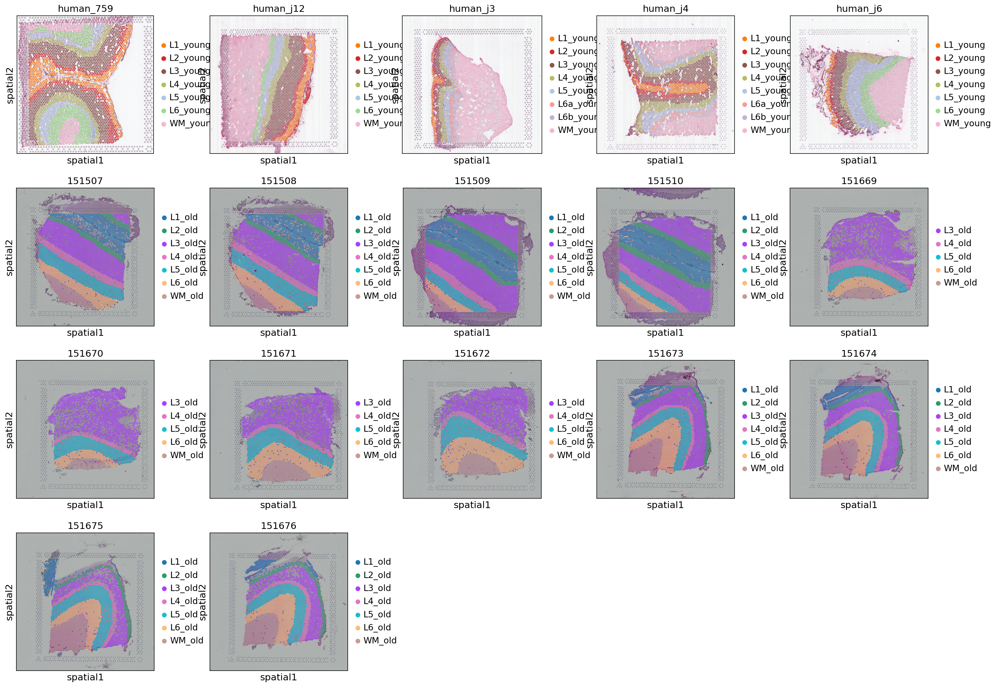

In [17]:
sq.pl.spatial_scatter(adata, color=['label'], library_key='sample_id', size=1.1, ncols=5, title=samples)

## Differential expression

In [18]:
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)

normalizing counts per cell
    finished (0:00:01)


In [19]:
sc.pp.highly_variable_genes(
    adata=adata, flavor="seurat", 
    n_top_genes=3000, inplace=True,
    batch_key="sample_id")

If you pass `n_top_genes`, all cutoffs are ignored.
extracting highly variable genes
    finished (0:00:21)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


In [20]:
highly_variable_genes = adata.var[adata.var.highly_variable].index.tolist()

### L1

In [21]:
sc.tl.rank_genes_groups(adata, groupby='label', groups=["L1_young"], reference='L1_old', method='wilcoxon', pts=True, key_added = "DE_L1")

ranking genes
    finished: added to `.uns['DE_L1']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:21)


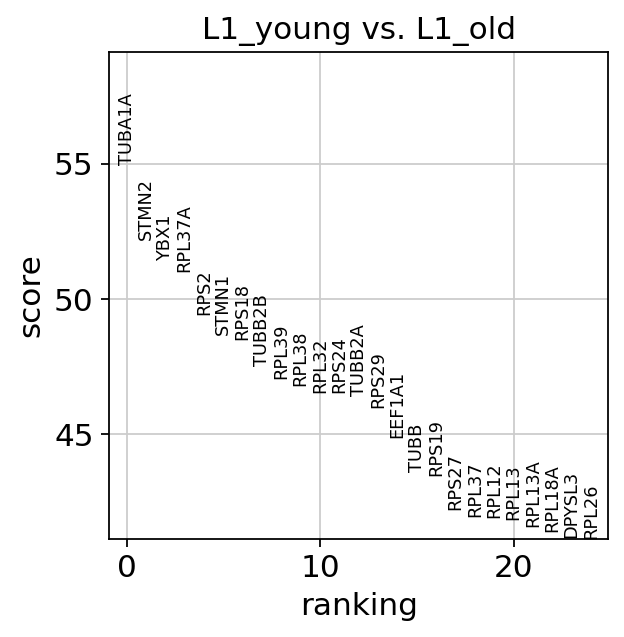

In [22]:
sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False, key="DE_L1")

Заметим большое количество рибосомных генов.

**TUBA1A** — Microtubules of the eukaryotic cytoskeleton perform essential and diverse functions and are composed of a heterodimer of alpha and beta tubulins

**STMN2** — This gene encodes a member of the stathmin family of phosphoproteins. Stathmin proteins function in microtubule dynamics and signal transduction. The encoded protein plays a regulatory role in neuronal growth and is also thought to be involved in osteogenesis. Reductions in the expression of this gene have been associated with Down's syndrome and Alzheimer's disease.

**YBX1** — This gene encodes a highly conserved cold shock domain protein that has broad nucleic acid binding properties

In [23]:
genes_rank_L1 = sc.get.rank_genes_groups_df(adata, group='L1_young', key='DE_L1')
genes_rank_L1.index = genes_rank_L1.names
genes_rank_L1['abs_lfc'] = genes_rank_L1['logfoldchanges'].abs()
genes_rank_L1

,names,scores,logfoldchanges,pvals,pvals_adj,pct_nz_group,abs_lfc
names,,,,,,,
TUBA1A,TUBA1A,54.976944,4.230728,0.0,0.0,1.000000,4.230728
STMN2,STMN2,52.180088,4.063926,0.0,0.0,0.993907,4.063926
YBX1,YBX1,51.389565,5.320566,0.0,0.0,0.971059,5.320566
RPL37A,RPL37A,51.018478,2.159951,0.0,0.0,1.000000,2.159951
RPS2,RPS2,49.419506,2.828351,0.0,0.0,0.998477,2.828351
...,...,...,...,...,...,...,...
MT-ND1,MT-ND1,-45.761562,-1.015448,0.0,0.0,1.000000,1.015448
MT-ND2,MT-ND2,-47.467903,-1.228950,0.0,0.0,0.998477,1.228950
MT3,MT3,-48.278576,-2.100850,0.0,0.0,0.945164,2.100850


<Axes: >

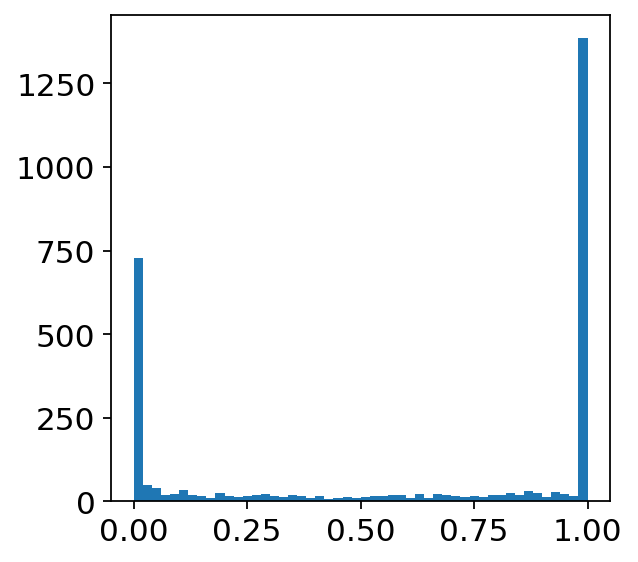

In [24]:
genes_rank_L1.loc[highly_variable_genes, 'pvals_adj'].hist(bins=50, grid=False)

Не понимаю на сколько нормально видеть такую картину

In [41]:
top_genes_df = genes_rank_L1.loc[highly_variable_genes][(genes_rank_L1.pvals_adj < 0.05) & (genes_rank_L1.pct_nz_group > 0.1)].sort_values(by='abs_lfc', ascending=False)
top_genes_df.head()

<ipython-input-41-0166b937c53b>:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  top_genes_df = genes_rank_L1.loc[highly_variable_genes][(genes_rank_L1.pvals_adj < 0.05) & (genes_rank_L1.pct_nz_group > 0.1)].sort_values(by='abs_lfc', ascending=False)


,names,scores,logfoldchanges,pvals,pvals_adj,pct_nz_group,abs_lfc
names,,,,,,,
HBG2,HBG2,11.418846,10.576180,3.366723e-30,1.086987e-28,0.206398,10.576180
NKAIN3,NKAIN3,13.376812,5.622586,8.261565e-41,3.702250e-39,0.246763,5.622586
CDK2AP1,CDK2AP1,30.219849,5.555900,1.299533e-200,2.898407e-198,0.566641,5.555900
MEX3A,MEX3A,7.759494,5.320932,8.526869e-15,1.293631e-13,0.143184,5.320932
YBX1,YBX1,51.389565,5.320566,0.000000e+00,0.000000e+00,0.971059,5.320566


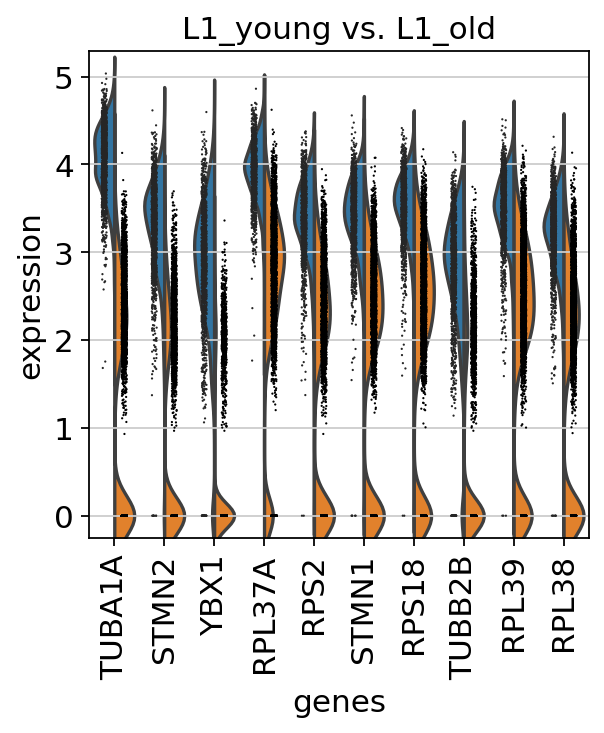

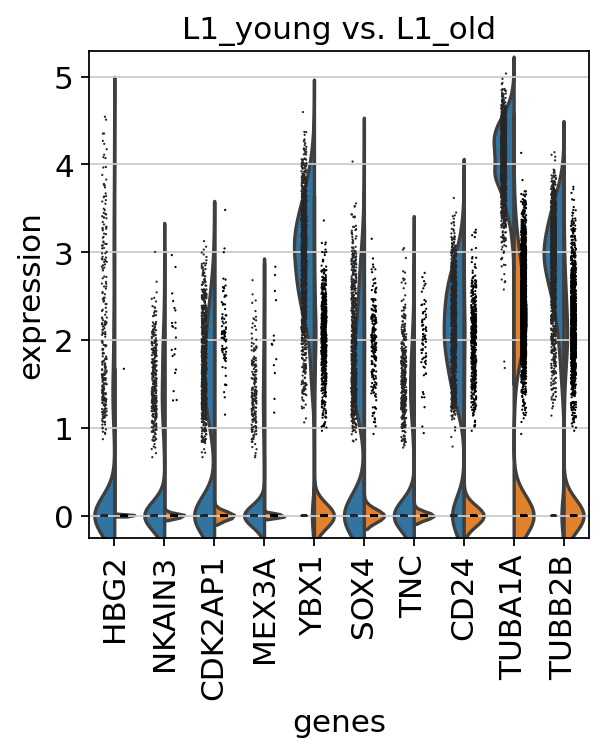

In [45]:
genes1 = genes_rank_L1.index[:10].tolist()
genes2 = top_genes_df.index[:10].tolist()
sc.pl.rank_genes_groups_violin(adata, gene_names=genes1, key="DE_L1")
sc.pl.rank_genes_groups_violin(adata, gene_names=genes2, key="DE_L1")

Посмотрим на отдельные образцы

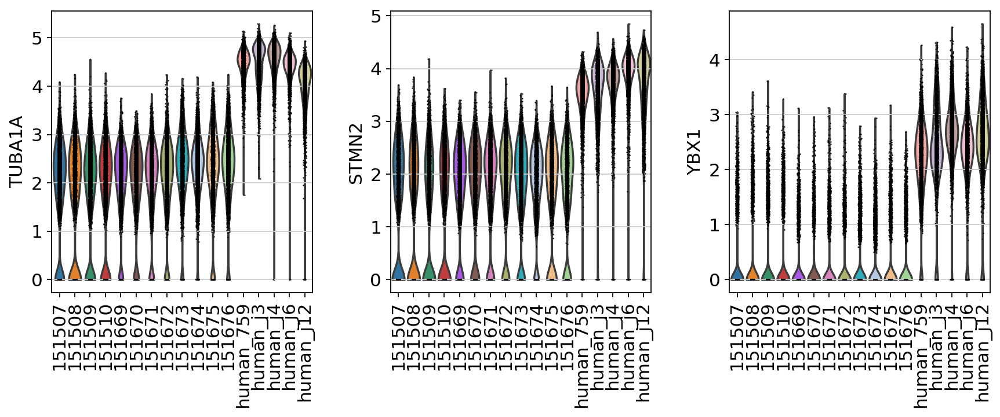

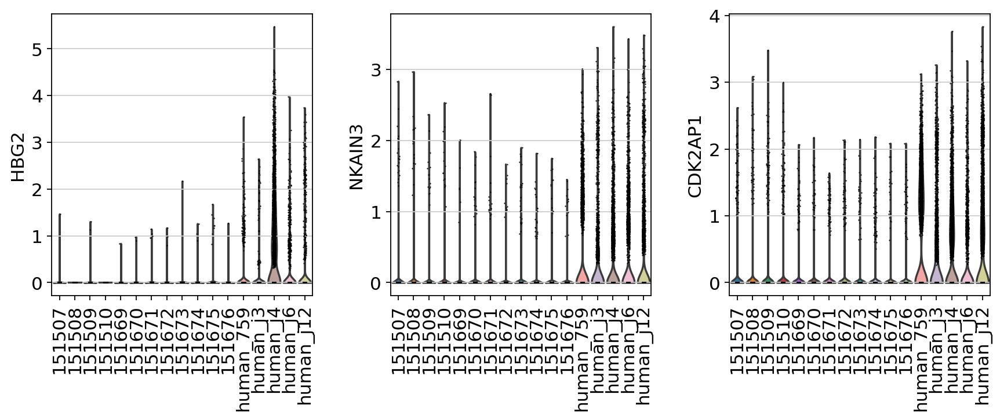

In [61]:
sc.pl.violin(adata, genes1[:3], groupby='sample_id', rotation=90)
sc.pl.violin(adata, genes2[:3], groupby='sample_id', rotation=90)

Что-то сортировка по logFC себя не оправдала

/usr/local/lib/python3.9/dist-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


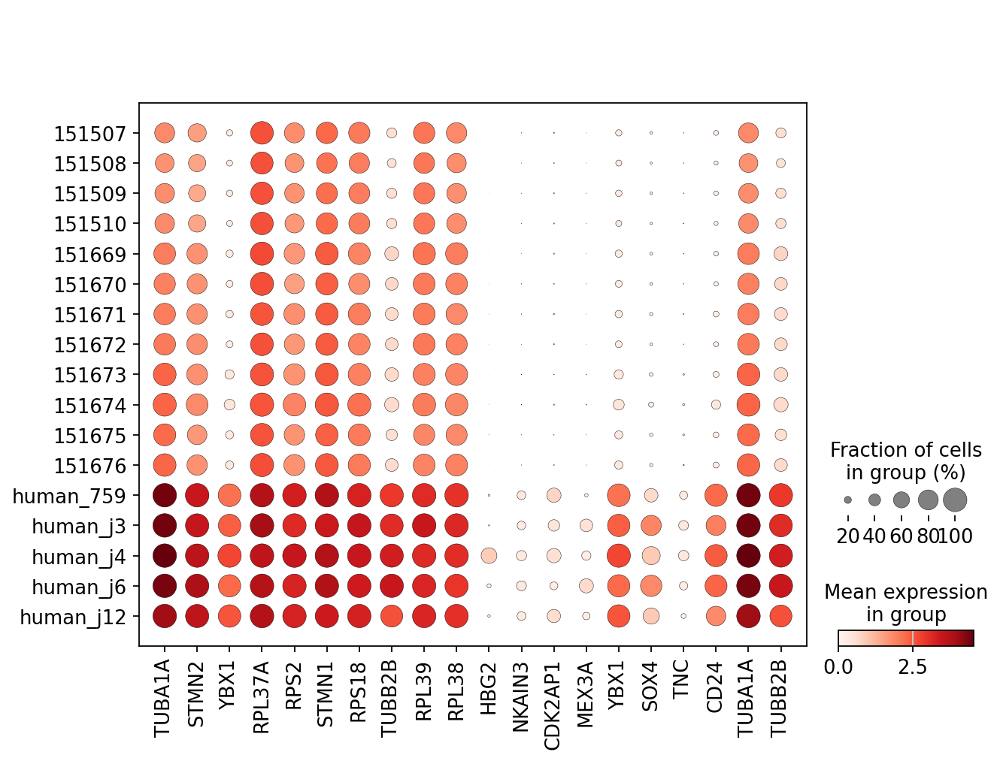

In [57]:
sc.pl.dotplot(adata, genes1 + genes2, groupby='sample_id')

### L2

In [66]:
sc.tl.rank_genes_groups(adata, groupby='label', groups=["L2_young"], reference='L2_old', method='wilcoxon', pts=True, key_added = "DE_L2")

ranking genes
    finished: added to `.uns['DE_L2']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:16)


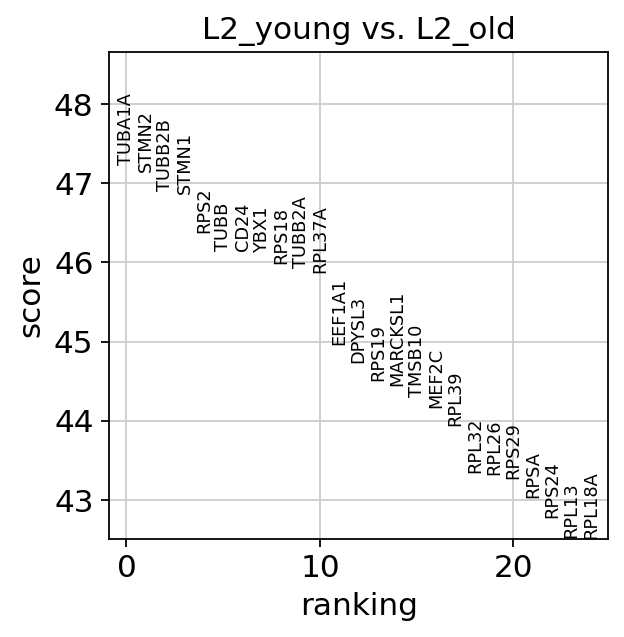

In [67]:
sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False, key="DE_L2")

Заметим большое количество рибосомных генов.

**TUBA1A** — Microtubules of the eukaryotic cytoskeleton perform essential and diverse functions and are composed of a heterodimer of alpha and beta tubulins

**STMN2** — This gene encodes a member of the stathmin family of phosphoproteins. Stathmin proteins function in microtubule dynamics and signal transduction. The encoded protein plays a regulatory role in neuronal growth and is also thought to be involved in osteogenesis. Reductions in the expression of this gene have been associated with Down's syndrome and Alzheimer's disease.

**YBX1** — This gene encodes a highly conserved cold shock domain protein that has broad nucleic acid binding properties

**CD24** — This gene encodes a sialoglycoprotein that is expressed on mature granulocytes and B cells and modulates growth and differentiation signals to these cells

In [68]:
genes_rank_L2 = sc.get.rank_genes_groups_df(adata, group='L2_young', key='DE_L2')
genes_rank_L2.index = genes_rank_L1.names
genes_rank_L2['abs_lfc'] = genes_rank_L1['logfoldchanges'].abs()
genes_rank_L2

,names,scores,logfoldchanges,pvals,pvals_adj,pct_nz_group,abs_lfc
names,,,,,,,
TUBA1A,TUBA1A,47.237171,3.965940,0.0,0.0,1.000000,3.965940
STMN2,STMN2,47.139286,3.905629,0.0,0.0,1.000000,3.905629
TUBB2B,TUBB2B,46.897518,4.597810,0.0,0.0,0.999022,4.597810
STMN1,STMN1,46.867607,2.327281,0.0,0.0,1.000000,2.327281
RPS2,RPS2,46.375423,2.782578,0.0,0.0,1.000000,2.782578
...,...,...,...,...,...,...,...
SNAP25,SNAP25,-46.175938,-3.072679,0.0,0.0,0.879648,3.072679
MT-ND1,MT-ND1,-46.712757,-1.544486,0.0,0.0,1.000000,1.544486
MT-ND2,MT-ND2,-46.937420,-1.936346,0.0,0.0,1.000000,1.936346


<Axes: >

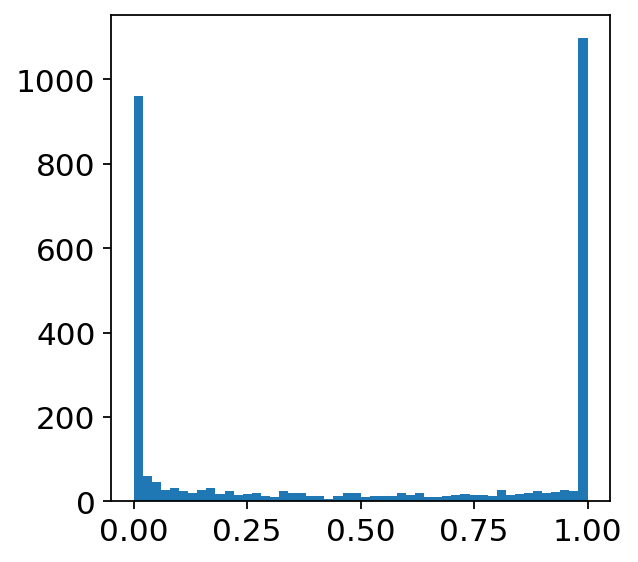

In [69]:
genes_rank_L2.loc[highly_variable_genes, 'pvals_adj'].hist(bins=50, grid=False)

Не понимаю на сколько нормально видеть такую картину

In [70]:
top_genes_df = genes_rank_L1.loc[highly_variable_genes][(genes_rank_L1.pvals_adj < 0.05) & (genes_rank_L1.pct_nz_group > 0.1)].sort_values(by='abs_lfc', ascending=False)
top_genes_df.head()

<ipython-input-70-0166b937c53b>:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  top_genes_df = genes_rank_L1.loc[highly_variable_genes][(genes_rank_L1.pvals_adj < 0.05) & (genes_rank_L1.pct_nz_group > 0.1)].sort_values(by='abs_lfc', ascending=False)


,names,scores,logfoldchanges,pvals,pvals_adj,pct_nz_group,abs_lfc
names,,,,,,,
HBG2,HBG2,8.347860,9.063767,6.951060e-17,5.405947e-16,0.177104,9.063767
MEX3A,MEX3A,17.998753,7.314165,1.992553e-72,7.336529e-71,0.383562,7.314165
CD24,CD24,46.143726,5.911074,0.000000e+00,0.000000e+00,0.985323,5.911074
NKAIN3,NKAIN3,12.856928,5.741463,7.864031e-38,1.368553e-36,0.277886,5.741463
TNC,TNC,13.174709,4.982639,1.226990e-39,2.261018e-38,0.287671,4.982639


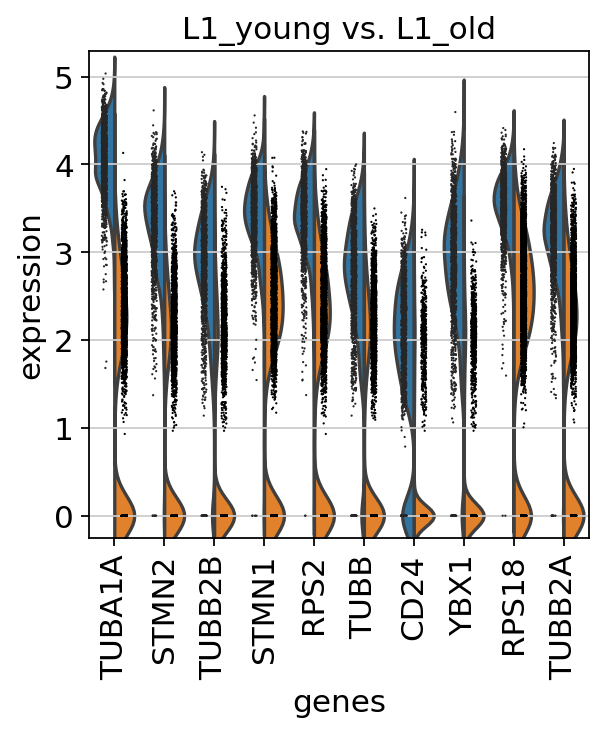

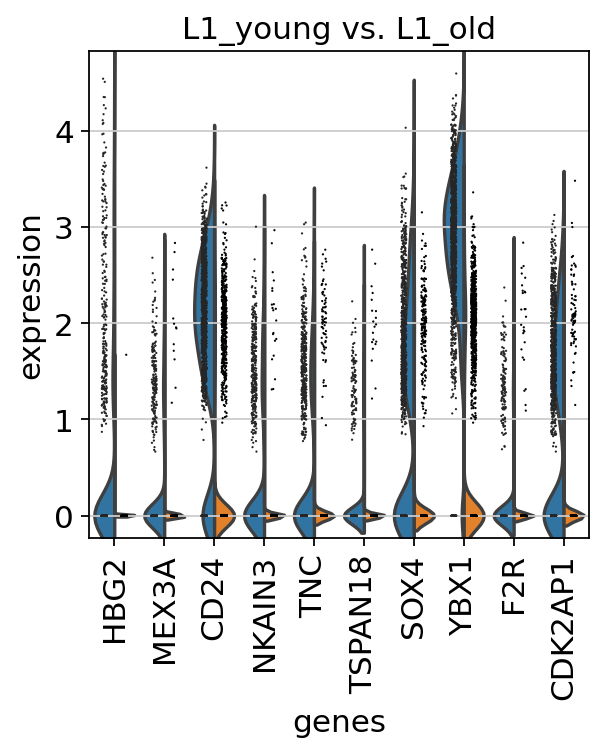

In [71]:
genes1 = genes_rank_L1.index[:10].tolist()
genes2 = top_genes_df.index[:10].tolist()
sc.pl.rank_genes_groups_violin(adata, gene_names=genes1, key="DE_L1")
sc.pl.rank_genes_groups_violin(adata, gene_names=genes2, key="DE_L1")

Посмотрим на отдельные образцы

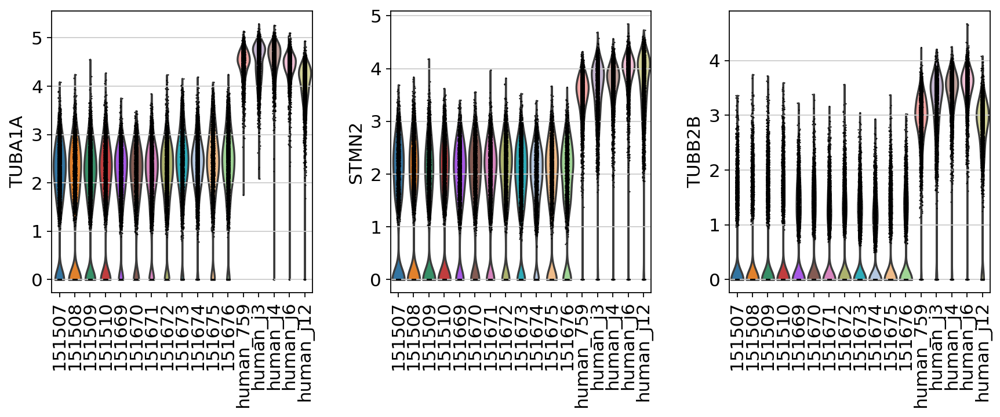

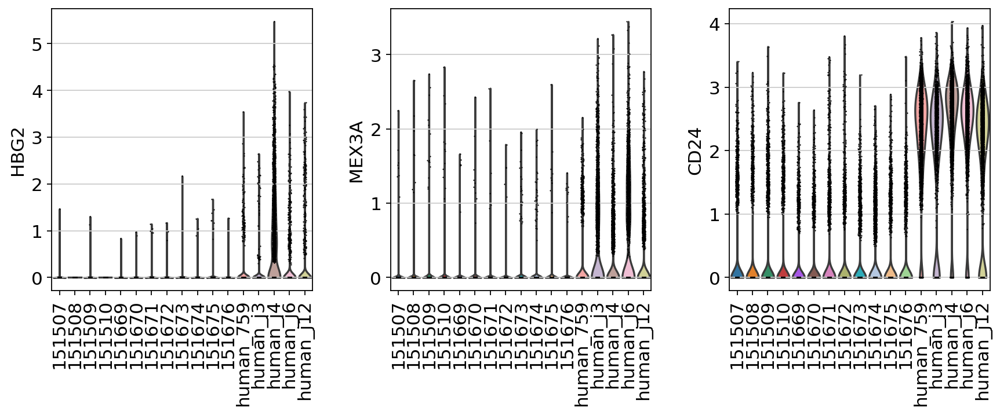

In [72]:
sc.pl.violin(adata, genes1[:3], groupby='sample_id', rotation=90)
sc.pl.violin(adata, genes2[:3], groupby='sample_id', rotation=90)

Что-то сортировка по logFC себя не оправдала

/usr/local/lib/python3.9/dist-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


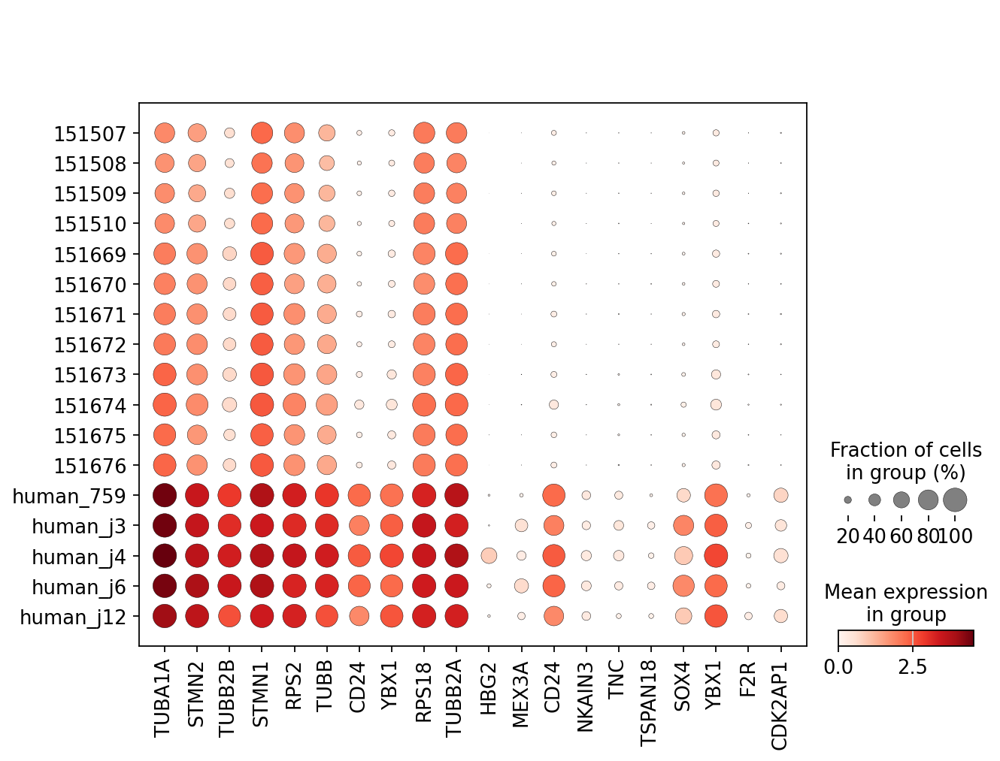

In [73]:
sc.pl.dotplot(adata, genes1 + genes2, groupby='sample_id')